# Imports

## Libraries

In [1]:
# Essentials
import pandas as pd
import numpy as np
# Image Handling
import cv2
import PIL 
# Pre-trained model for OCR
from pytesseract import image_to_string, image_to_data
# For NER
import spacy

## Data Source

In [2]:
PATH = "../Data/"

# Checking the images

## Using CV2: Popping out a window to show sample image
Note: This usually comes along with installing Open-CV

### Loading the Image
The result of this will be a numpy-array

In [3]:
cv2_sample_img = cv2.imread(PATH + "IMG_20200209_183222.jpg")

In [4]:
cv2_sample_img.shape

(1824, 4000, 3)

### Displaying the Image

In [10]:
im_S = cv2.resize(cv2_sample_img, (960, 540))                          # Resize Image             
cv2.imshow(f"Busines Card {PATH + "IMG_20200209_183222.jpg"}", im_S)   # Create window header and add the image (Note: by default it will be big)
cv2.waitKey(0)                                                        # Display the page indefinitely until keypress
cv2.destroyAllWindows()                                               # Make sures that all open windows are closed                                       

## Using Pillow: Displaying in the notebook

### Loading the Image

In [11]:
pil_sample_img = PIL.Image.open(PATH + "IMG_20200209_183222.jpg")

In [12]:
type(pil_sample_img)

PIL.JpegImagePlugin.JpegImageFile

### Displaying the Image

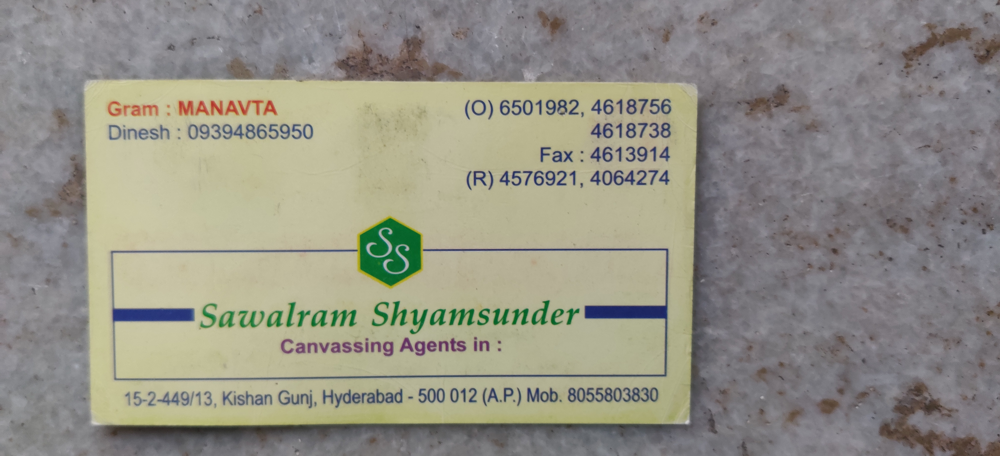

In [13]:
pil_sample_img

# Image to Text

## From CV

In [14]:
cv_sample_text = image_to_string(cv2_sample_img)
print(cv_sample_text)

Gram : MANAVTA —" (0) 6501982, 4618756

Dinesh : 09394865950 en 4618738
, Fax : 4613914
(R) 4576921, 4064274

'Sawalram Shyamsunder

Canvassing Agents in :

15-2-449/13, Kishan Gunj, Hyderabad - 500 012 (A.P.) Mob. 8055803830



## From Pillow

In [15]:
pil_sample_text = image_to_string(pil_sample_img)
print(pil_sample_text)

con MANAVTA -_— (0) 6501982, 4618756
Dinesh : 09394865950 nee 4618738
e4 Fax : 4613914

(R) 4576921, 4064274

=Sawalram Shyamsunder

Canvassing Agents in :

15-2-449/13, Kishan Gun, eee: Ants 012 pe ro Mob Ree



### Takeaway
- It looks better when converted to cv2
    - See the text below comparison

# Image to Data

In [16]:
cv_sample_data = image_to_data(cv2_sample_img)

## Displaying the text extracted based from several features

In [17]:
print(cv_sample_data)

level	page_num	block_num	par_num	line_num	word_num	left	top	width	height	conf	text
1	1	0	0	0	0	0	0	4000	1824	-1	
2	1	1	0	0	0	0	0	4000	1824	-1	
3	1	1	1	0	0	0	0	4000	1824	-1	
4	1	1	1	1	0	662	0	3338	587	-1	
5	1	1	1	1	1	662	0	3338	587	95.000000	     
4	1	1	1	2	0	440	587	3560	546	-1	
5	1	1	1	2	1	440	587	3560	546	95.000000	   
4	1	1	1	3	0	440	1133	3560	329	-1	
5	1	1	1	3	1	440	1133	684	329	95.000000	  
5	1	1	1	3	2	2005	1133	1995	329	95.000000	  
4	1	1	1	4	0	0	1462	4000	213	-1	
5	1	1	1	4	1	0	1462	4000	213	95.000000	   
4	1	1	1	5	0	0	1675	4000	149	-1	
5	1	1	1	5	1	0	1675	4000	149	95.000000	 
2	1	2	0	0	0	424	321	2261	166	-1	
3	1	2	1	0	0	424	321	2261	166	-1	
4	1	2	1	1	0	424	321	2261	166	-1	
5	1	2	1	1	1	424	368	209	119	91.899391	Gram
5	1	2	1	1	2	671	419	10	45	83.134674	:
5	1	2	1	1	3	761	368	348	119	91.710236	MANAVTA
5	1	2	1	1	4	1462	419	241	56	50.762321	—"
5	1	2	1	1	5	1855	321	117	157	96.405861	(0)
5	1	2	1	1	6	2000	351	335	118	94.956551	6501982,
5	1	2	1	1	7	2365	339	320	123	96.815109	4618756
2	1	3	

In [18]:
def image_data_to_dataframe(image_to_data_result):

    get_val = list(map(lambda v: v.split("\t"), image_to_data_result.split("\n")))
    columns_found = get_val[0]
    values_found = get_val[1:]

    return pd.DataFrame(data=values_found, columns=columns_found)

In [19]:
df_cv_sample = image_data_to_dataframe(cv_sample_data)

In [20]:
df_cv_sample.head(20)

,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
0,1,1,0,0,0,0,0,0,4000,1824,-1,
1,2,1,1,0,0,0,0,0,4000,1824,-1,
2,3,1,1,1,0,0,0,0,4000,1824,-1,
3,4,1,1,1,1,0,662,0,3338,587,-1,
4,5,1,1,1,1,1,662,0,3338,587,95.000000,
5,4,1,1,1,2,0,440,587,3560,546,-1,
6,5,1,1,1,2,1,440,587,3560,546,95.000000,
7,4,1,1,1,3,0,440,1133,3560,329,-1,
8,5,1,1,1,3,1,440,1133,684,329,95.000000,
9,5,1,1,1,3,2,2005,1133,1995,329,95.000000,


In [21]:
df_cv_sample.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75 entries, 0 to 74
Data columns (total 12 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   level      75 non-null     object
 1   page_num   74 non-null     object
 2   block_num  74 non-null     object
 3   par_num    74 non-null     object
 4   line_num   74 non-null     object
 5   word_num   74 non-null     object
 6   left       74 non-null     object
 7   top        74 non-null     object
 8   width      74 non-null     object
 9   height     74 non-null     object
 10  conf       74 non-null     object
 11  text       74 non-null     object
dtypes: object(12)
memory usage: 7.2+ KB


In [22]:
df_cv_sample.dropna(inplace=True)

In [23]:
select_cols = ["level","page_num","block_num","par_num","line_num","word_num","left","top","width","height","conf"]
df_cv_sample[select_cols] = df_cv_sample[select_cols].astype(float)
df_cv_sample[select_cols] = df_cv_sample[select_cols].astype(int)

In [24]:
df_cv_sample[select_cols].astype(int)

,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf
0,1,1,0,0,0,0,0,0,4000,1824,-1
1,2,1,1,0,0,0,0,0,4000,1824,-1
2,3,1,1,1,0,0,0,0,4000,1824,-1
3,4,1,1,1,1,0,662,0,3338,587,-1
4,5,1,1,1,1,1,662,0,3338,587,95
...,...,...,...,...,...,...,...,...,...,...,...
69,5,1,8,1,1,6,1674,1553,105,58,93
70,5,1,8,1,1,7,1801,1552,106,58,93
71,5,1,8,1,1,8,1930,1550,155,76,34
72,5,1,8,1,1,9,2109,1550,139,62,72


In [44]:
def visualize_levels(read_image, imagedata_dataframe, level="page"):

    copied_image = read_image.copy()

    for d_level, d_x, d_y, d_width, d_height, d_confidence, d_text in imagedata_dataframe[["level","left","top","width","height","conf","text"]].values:

        # Highlight Page Level
        if level == "page" and d_level == 1:
            cv2.rectangle(copied_image,                       # Copied Image
                          (d_x, d_y),                         # Coordinates of where the Level is found
                          (d_x + d_width, d_y + d_height),    # Creating bounding box
                          (0, 0, 0),                          # Color of bounding box
                          2                                   # Thickness of the line of bounding box
                         )

        # Highlight Block Level
        elif level == "block" and d_level == 2:
            cv2.rectangle(copied_image,
                          (d_x, d_y),
                          (d_x + d_width, d_y + d_height),
                          (255, 0, 0),
                          2
                         )

        # Highlight Paragraph Level
        elif level == "paragraph" and d_level == 3:
            cv2.rectangle(copied_image,
                          (d_x, d_y),
                          (d_x + d_width, d_y + d_height),
                          (0, 255, 0),
                          2
                         )

        # Highlight Line Level
        elif level == "block" and d_level == 4:
            cv2.rectangle(copied_image,
                          (d_x, d_y),
                          (d_x + d_width, d_y + d_height),
                          (0, 0, 255),
                          2
                         )

        elif level == "word" and d_level == 5:
            cv2.rectangle(copied_image,
                          (d_x, d_y),
                          (d_x + d_width, d_y + d_height),
                          (0, 255, 0),
                          2
                         )
            cv2.putText(copied_image,                # Copied Image
                        d_text,                      # What text will be placed
                        (d_x, d_y),                  # Which coordinates will the text will be
                        cv2.FONT_HERSHEY_PLAIN, 4,   # Font style and size
                        (255, 0, 0),                 # Font Color
                        7                            # Font Thickness
                       )
        
        else:
            continue
            

    resize_image = cv2.resize(copied_image, (960, 540))
    cv2.imshow(f"Display Image", resize_image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()       

In [45]:
visualize_levels(cv2_sample_img, df_cv_sample, level="word")